In [51]:
import json
import time
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import AffinityPropagation
import matplotlib.pyplot as plt

In [166]:
FILE_NAME = "/code/tmp/output_1000.json"

with open(FILE_NAME, 'r') as f:
    lines = f.read()

lines

'{"uuid": "9accae91-4339-40e4-87db-03f446295c0c", "text": "7316 I admit, the great majority Howard Hughes?", "embedding": [0.08265981823205948, -0.003910927567631006, -0.09897520393133163, 0.00018613849533721805, 0.011625337414443493, -0.0034296722151339054, -0.046466533094644547, 0.03300270438194275, -0.07402294874191284, -0.052507832646369934, 0.00039215153083205223, -0.12111396342515945, 0.030718045309185982, 0.08059383183717728, 0.005496548023074865, 0.004270592704415321, 0.007647651247680187, -0.018710695207118988, -0.017675651237368584, -0.0005542440921999514, -0.07012727111577988, -0.02079487033188343, -0.010672145523130894, -0.018036838620901108, -0.04745117574930191, -0.032987404614686966, 0.030589446425437927, 0.014170427806675434, 0.010948295705020428, 0.05739409849047661, -0.021245986223220825, 0.01805366575717926, -0.012952613644301891, -0.04512026533484459, -0.003821746213361621, -0.053364064544439316, 0.018233871087431908, -0.05685437098145485, 0.07068400830030441, 0.058

In [121]:
import pathlib
# print(pathlib.Path().resolve())

FILE_NAME = "/code/tmp/output_.json"

with open(FILE_NAME, 'r') as f:
    lines = f.readlines()
# print(f"Finished reading lines at t={time.time() - start_time} sec")

in_array = []
input_embeddings = []
for line in lines:
    input_embeddings.append(json.loads(line))

# print(input_embeddings[:2])

for embedding in input_embeddings:
    in_array.append(embedding.get('embedding'))
# print(f"Finished de-serializing file at t={time.time() - start_time} sec")


Finished t-SNE file at t=3.9279632568359375 sec
Finished clustering at t=5.799772500991821 sec


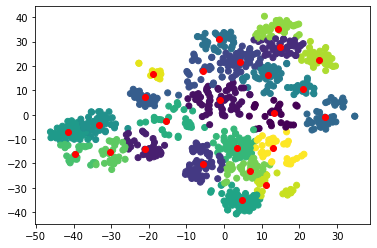

In [122]:
start_time = time.time()

X = np.array(in_array)
X_dim_red = TSNE(n_components=2, learning_rate=200, perplexity=30).fit_transform(X)
print(f"Finished t-SNE file at t={time.time() - start_time} sec")

clustering = AffinityPropagation(random_state=5, damping=0.95).fit(X_dim_red)
print(f"Finished clustering at t={time.time() - start_time} sec")

cluster_labels = clustering.labels_
# print(cluster_labels)
cluster_centers = clustering.cluster_centers_
# print(cluster_centers.shape)

plt.scatter(X_dim_red[:,0], X_dim_red[:,1], c=clustering.labels_)
plt.scatter(cluster_centers[:,0], cluster_centers[:,1], c='red')
plt.show()

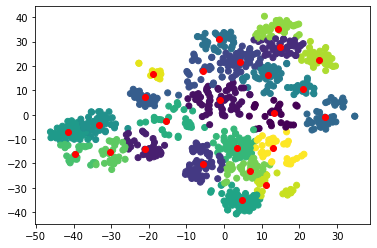

[[-22.642187   21.129324 ]
 [-22.641054   21.133532 ]
 [ 10.6460905  34.11863  ]
 ...
 [ 19.929495   32.86364  ]
 [ 13.475923   27.25411  ]
 [ 20.575481   22.311691 ]]
[[ 13.178366    0.8573443]
 [ -1.1801575   6.227593 ]
 [-21.06151   -14.151254 ]
 [ 14.724474   27.869251 ]
 [ -5.616189  -20.265234 ]
 [  4.2473707  21.726336 ]
 [ -5.7053823  18.132925 ]
 [-21.1373      7.2363415]
 [ 26.734724   -0.963446 ]
 [ -1.2510008  30.927246 ]
 [ 11.69895    16.181171 ]
 [ 20.90468    10.684985 ]
 [-33.232525   -4.0246625]
 [-41.421062   -7.150608 ]
 [  4.804508  -34.965828 ]
 [-15.415893   -2.6380672]
 [  3.4280417 -13.573253 ]
 [-39.530716  -16.251768 ]
 [-30.180098  -15.494253 ]
 [  6.782292  -23.27933  ]
 [ 14.311958   35.109882 ]
 [ 25.08909    22.550842 ]
 [ 11.023671  -28.745613 ]
 [-18.860718   16.538065 ]
 [ 12.941736  -13.654595 ]]


In [131]:
plt.scatter(X_dim_red[:,0], X_dim_red[:,1], c=clustering.labels_)
plt.scatter(cluster_centers[:,0], cluster_centers[:,1], c='red')
plt.show()
print(X_dim_red)
print(cluster_centers)

In [160]:
summary = []
for i in range(X.shape[0]):
    entry = {
        'x': str(X_dim_red[i, 0]),
        'y': str(X_dim_red[i, 1]),
        'uuid': input_embeddings[i].get('uuid'),
        'text': input_embeddings[i].get('text'),
        'cluster_label': int(cluster_labels[i]),
        'is_cluster_head': X_dim_red[i, :] in cluster_centers
    }
    summary.append(entry)
result = sorted(summary, key= lambda a: (a['cluster_label'], not a['is_cluster_head']))
# print(json.dumps(result, indent=4))

In [161]:
result

[{'x': '13.178366',
  'y': '0.8573443',
  'uuid': '83b57861-6a05-4ce6-a1a2-2990b77e5286',
  'text': 'The deflector does a good job navigating the air in the direction desired and the magnets reliably hold it in place on a vertical vent in a wall. I am happy with the product, happy enough to order another one!',
  'cluster_label': 0,
  'is_cluster_head': True},
 {'x': '8.227351',
  'y': '3.9767694',
  'uuid': '15f8564c-ec2e-4db4-b6ef-a14d4dd04905',
  'text': '',
  'cluster_label': 0,
  'is_cluster_head': False},
 {'x': '14.520397',
  'y': '1.5306919',
  'uuid': '14b9859d-0128-4879-94e1-b5e57edbb93a',
  'text': 'I have two vents directly over my living room sofa and although I have lived with them blowing directly on me for a long time, a suggestion by a friend, had me search out diffusers.  I am really glad that I did.The diffusers work great in re-directing the air flow off of me and either into the room or towards the windows.  The magnets hold perfectly on my ceiling vents and the di

In [164]:
FILE_NAME_CLUSTERED = "/code/tmp/output_clustered.json"

with open(FILE_NAME_CLUSTERED, 'w') as f:
    f.write(json.dumps(result, indent=4))
